# MCMC Comparison

## surmise

1. Train a GP (using surmise) to emulate the ${}^3{\rm He}(\alpha,\gamma)$ observables. 
2. Use that GP to calculate the $R$-matrix parameter posteriors.
3. Compare to the results in our BRICK paper.


* CS model
* maximally 1000 training points

In [1]:
import os
import subprocess
from smt.sampling_methods import LHS

import numpy as np
import matplotlib.pyplot as plt
from corner import corner
import seaborn as sns
from scipy import stats
from surmise.emulation import emulator
import emcee
import h5py

import model
import priors

In [2]:
plt.style.use('science')
gr = (1 + np.sqrt(5)) / 2
h = 3

plt.rcParams['figure.dpi'] = 150

## Train the GP

In [4]:
data = np.load('datfiles/posterior_samples.npy')
points = np.load('datfiles/posterior_chain.npy')
x = model.x.copy()[:, np.newaxis]
y = model.y.copy()[:, np.newaxis]
dy = model.dy.copy()[:, np.newaxis]

In [5]:
ntrain = 200
ntest = 1000 - ntrain

In [64]:
f = data[:ntrain, :].T
w = points[:ntrain, :16]

In [65]:
x.shape, w.shape, f.shape

((573, 1), (200, 16), (573, 200))

In [66]:
# Set up the surmise emulator.
args = {'epsilon' : 0.1, 'warnings' : True}
# args = {'epsilon': 0.1, ‘hypregmean’: -8}
emu = emulator(x=x, theta=w, f=f, method='PCGPwM', args=args)

PCGPwM considering  52 PCs


In [67]:
def residuals(y, mu, dy):
    return (y - mu) / dy

def relative_uncertainties(p):
    return (np.sqrt(p.var()) / p.mean())[0]

def absolute_uncertainties(p):
    return np.sqrt(p.var())[0]

In [68]:
%%time
ptrain = emu.predict() # Let's check how the training went.

CPU times: user 3.48 s, sys: 468 ms, total: 3.95 s
Wall time: 256 ms


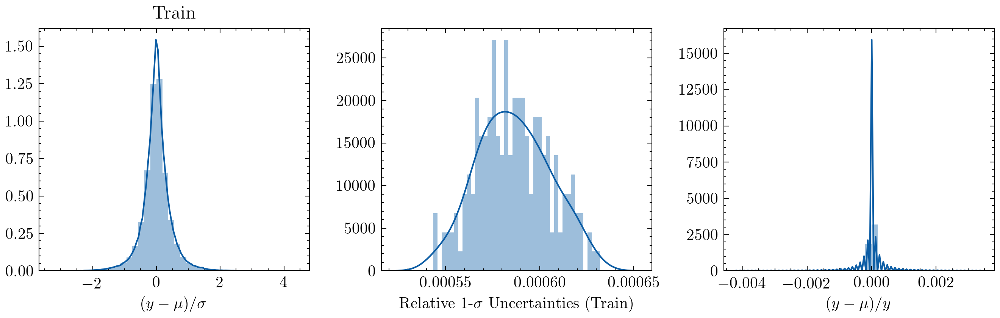

In [69]:
fig, ax = plt.subplots(ncols=3, figsize=(3*h, h), dpi=300)
fig.patch.set_facecolor('white')

sns.distplot(residuals(f, ptrain.mean(), np.sqrt(ptrain.var())).flatten(), bins=40, ax=ax[0], kde=True)
ax[0].set_xlabel(r'$(y-\mu)/\sigma$')
ax[0].set_title('Train')

sns.distplot(relative_uncertainties(ptrain).flatten(), bins=40, ax=ax[1], kde=True) 
ax[1].set_xlabel(r'Relative 1-$\sigma$ Uncertainties (Train)')

sns.distplot(((f - ptrain.mean()) / f).flatten(), bins=40, ax=ax[2], kde=True) 
ax[2].set_xlabel(r'$(y-\mu)/y$')

plt.tight_layout();

In [73]:
fp = data[ntrain:, :]
wp = points[ntrain:, :16]

In [74]:
fp.shape, 

((800, 573),)

In [75]:
# Now let's test it.
p = emu.predict(x=x, theta=wp)

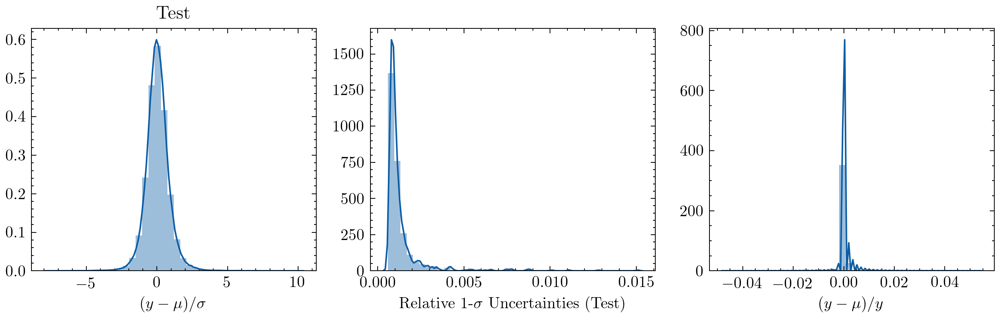

In [76]:
fig, ax = plt.subplots(ncols=3, figsize=(3*h, h), dpi=300)
fig.patch.set_facecolor('white')

sns.distplot(residuals(fp.T, p.mean(), np.sqrt(p.var())).flatten(), bins=40, ax=ax[0], kde=True)
ax[0].set_xlabel(r'$(y-\mu)/\sigma$')
ax[0].set_title('Test')

sns.distplot(relative_uncertainties(p).flatten(), bins=40, ax=ax[1], kde=True) 
ax[1].set_xlabel(r'Relative 1-$\sigma$ Uncertainties (Test)')

sns.distplot(((fp.T - p.mean()) / fp.T).flatten(), bins=40, ax=ax[2], kde=True) 
ax[2].set_xlabel(r'$(y-\mu)/y$')

plt.tight_layout();

In [77]:
bounds = np.array([[np.min(w[:, i]), np.max(w[:, i])] for i in range(w.shape[1])])

In [78]:
%%time
emu.predict(w[0, :, np.newaxis])

CPU times: user 2.26 s, sys: 365 ms, total: 2.63 s
Wall time: 175 ms


A emulation prediction object predict where the code in located in the file  emulation.  The main method are predict.covx, predict.covxhalf, predict.covxhalf_gradtheta, predict.lpdf, predict.lpdf_gradtheta, predict.mean, predict.mean_gradtheta, predict.rnd, predict.var.  Default of predict() is predict.mean() and predict(s) will run pred.rnd(s). Run help(predict) for the document string.

In [79]:
def ln_prior(theta):
    return np.sum([p.logpdf(t) for (p, t) in zip(priors.priors, theta)])

In [80]:
nbr = model.nbr
nrpar = 16
nf_capture = 6
nf_scatter = 10

num_data_points = y.shape[0]
num_pts_branching_ratio = model.branching_ratio.size

In [81]:
class Model:
    def __init__(self, emu):
        self.emu = emu
    
    
    def gp_predict(self, theta):
        p = self.emu.predict(theta=theta)
        mu = p.mean().T[0]
        var = p.var().T[0]
        return mu, var
    
    
    def ln_likelihood(self, theta):
        theta_R = theta[:nrpar]
        theta_f_capture = theta[nrpar:nrpar+nf_capture]
        theta_f_scatter = theta[nrpar+nf_capture:]
        
        f_capture = model.map_uncertainty(theta_f_capture, model.num_pts_capture)
        f_scatter = model.map_uncertainty(theta_f_scatter, model.num_pts_scatter)
        
        f = np.ones(num_data_points)
        f[nbr:num_pts_branching_ratio+model.num_pts_total_capture] = f_capture
        f[nbr+model.num_pts_total_capture:] = f_scatter
        
        mu, var = self.gp_predict(theta_R)
        var_tot = (f*dy)**2 + var
        var_tot_no_norm = dy**2 + var
        return np.sum(-np.log(np.sqrt(2*np.pi*var_tot_no_norm)) - (f*y - mu)**2 / var_tot)


    def ln_posterior(self, theta):
        lnpi = ln_prior(theta)
        if lnpi == -np.inf:
            return -np.inf
        return lnpi + self.ln_likelihood(theta)

In [82]:
model_gp = Model(emu)

In [83]:
theta_star = np.load('datfiles/theta_star.npy')[:-1]

In [84]:
nd = theta_star.size
nw = 2*nd

In [85]:
nd

32

In [86]:
p0 = np.array(
    [stats.norm(theta_star, 0.01*np.abs(theta_star)).rvs() for _ in range(nw)]
)

In [87]:
moves = [(emcee.moves.DEMove(), 0.2), (emcee.moves.DESnookerMove(), 0.8)]
sampler_gp = emcee.EnsembleSampler(nw, nd, model_gp.ln_posterior, moves=moves)
# sampler_r = emcee.EnsembleSampler(nw, nd, model_r.ln_posterior, moves=moves)

In [146]:
state = sampler_gp.run_mcmc(state.coords, 500, thin_by=20, tune=True, progress=True)

100%|██████████| 10000/10000 [39:09<00:00,  4.26it/s]


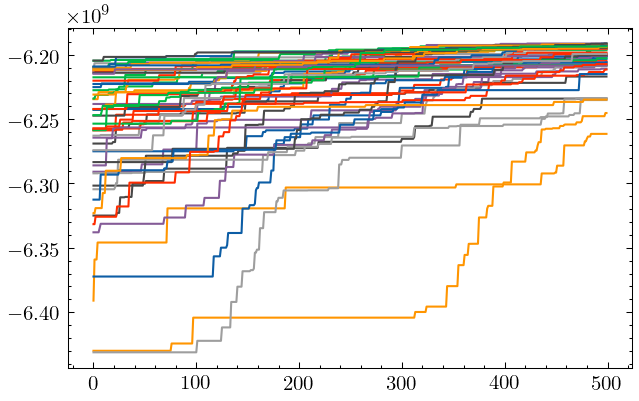

In [149]:
fig, ax = plt.subplots(figsize=(gr*h, h))
fig.patch.set_facecolor('white')

nb = 2100
lnp_min = -6.5e9

lnp = sampler_gp.get_log_prob(discard=nb)
ii = np.where(np.min(lnp, axis=0) > lnp_min)[0]

ax.plot(lnp[:, ii]);

In [150]:
chain = sampler_gp.get_chain(discard=nb)[:, ii, :]
_, _, nd = chain.shape
flat_chain = chain.reshape(-1, nd)

In [151]:
flat_chain.shape

(26500, 32)

In [152]:
from corner import corner

In [153]:
nrpar = 16

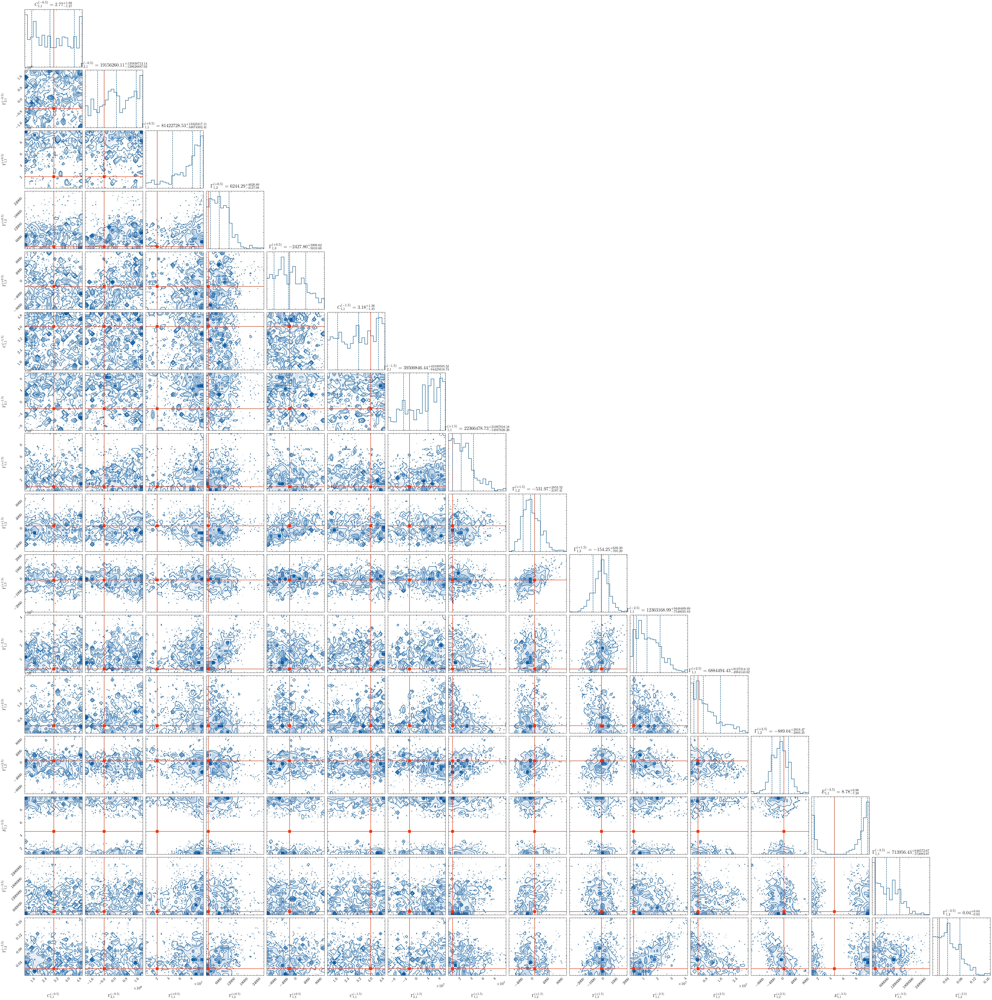

In [154]:
fig = corner(flat_chain[:, :nrpar], show_titles=True, quantiles=[0.16, 0.5, 0.84], color='C0', 
             truths=theta_star[:nrpar], truth_color='C3', labels=model.azr.config.labels)
fig.patch.set_facecolor('white')

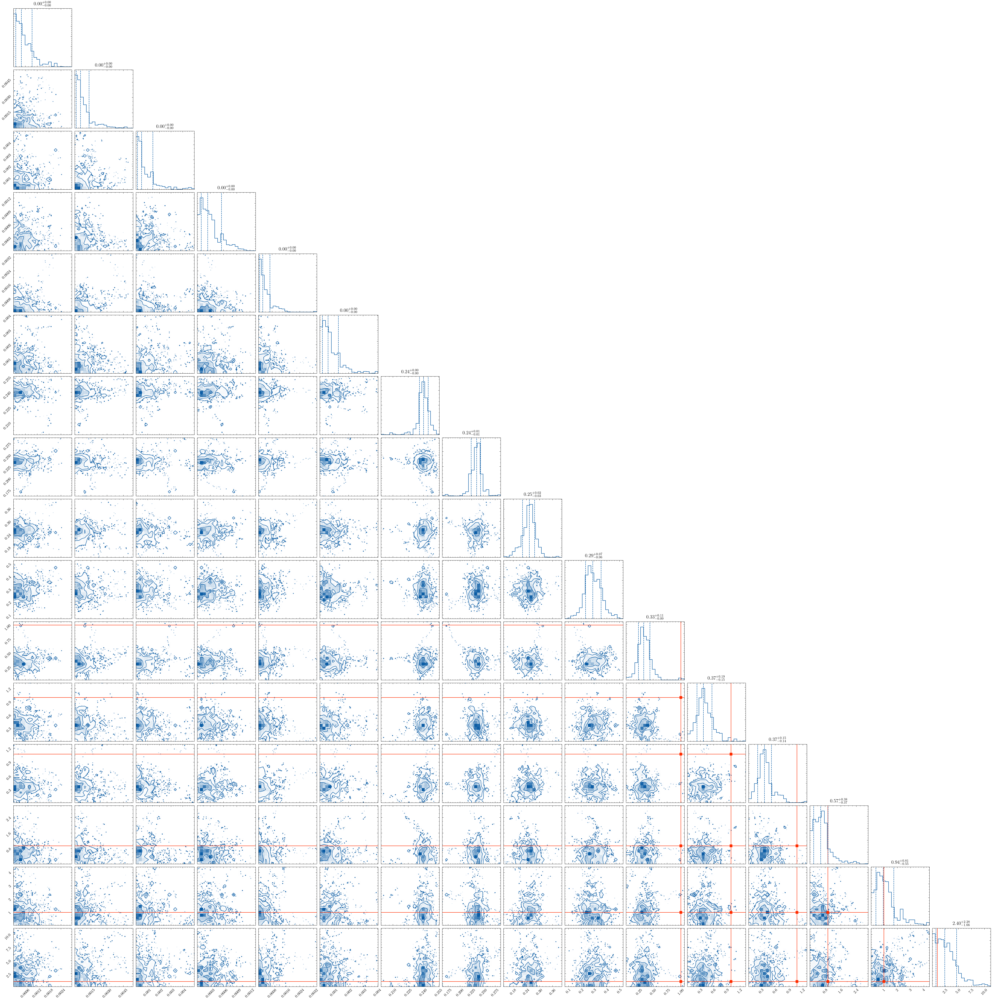

In [155]:
fig = corner(flat_chain[:, nrpar:], show_titles=True, quantiles=[0.16, 0.5, 0.84], color='C0', 
             truths=theta_star[nrpar:], truth_color='C3')
fig.patch.set_facecolor('white')

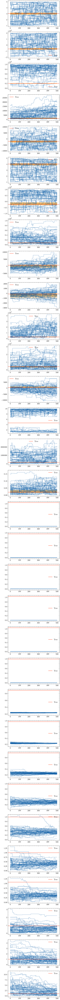

In [156]:
fig, ax = plt.subplots(nd, figsize=(gr*h, nd*h))
fig.patch.set_facecolor('white')

for i in range(nd):
    ax[i].plot(chain[:, :, i], alpha=0.5, color='C0')
#     ax[i].plot(w[:, i], label='Train')
    if i < 16:
        low_68, high_68 = np.quantile(w[:, i], [0.16, 0.84])
        low_95, high_95 = np.quantile(w[:, i], [0.05, 0.95])
        ax[i].fill_between(np.arange(chain[:, :, i].shape[0]), low_68, high_68, color='C2', alpha=0.5)
        ax[i].fill_between(np.arange(chain[:, :, i].shape[0]), low_95, high_95, color='C2', alpha=0.25)
#     ax[i].set_ylabel(parameter_labels[i])
    ax[i].axhline(theta_star[i], color='C3', label='True')
    ax[i].legend()

# plt.savefig(f'figures/chains_{rel_unc:.2f}.pdf')

In [105]:
theta_star.shape

(32,)

In [108]:
w.shape

(200, 16)

In [111]:
p_star = emu.predict(theta=theta_star[:nrpar])

In [118]:
mu_star, var_star = p_star.mean(), p_star.var()

/home/odell/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: Support for passing a (n, 1)-shaped error array to errorbar() is deprecated since Matplotlib 3.1 and will be removed in 3.3; pass a 1D array instead.
  """Entry point for launching an IPython kernel.


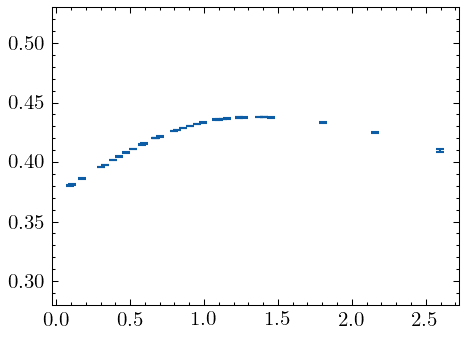

In [122]:
plt.errorbar(model.x[:nbr], mu_star[:nbr], yerr=np.sqrt(var_star[:nbr]), linestyle='', capsize=2)
plt.ylim([0.28, 0.53]);